In [1]:
#Downloading important libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sweetviz as sv
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objs as go # visualization
from plotly.subplots import make_subplots
import plotly.figure_factory as go
import statsmodels as sm
import os
#!pip install sqlalchmy
#!pip install mysql-connector
#!pip install pymysql
import mysql.connector
#!pip install sweetviz
!pip install imblearn
import math
import pylab as py
import statsmodels as sm
from scipy import stats
#!pip install imblearn
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency 
from sklearn.feature_selection import RFECV
from imblearn.over_sampling import RandomOverSampler
from collections import Counter 
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict,StratifiedKFold,GridSearchCV, RandomizedSearchCV 
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report, precision_score, recall_score, roc_curve, roc_auc_score, f1_score,fbeta_score
from sklearn.base import BaseEstimator
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder as le
plt.style.use("ggplot")
#import mysql

In [2]:
#Fetching and Downloading data from database
connection  = mysql.connector.connect(host = '18.136.157.135',
                                     user = 'dm_team3',
                                     password = 'DM!$!Team!27@9!20&')

In [3]:
cursor = connection.cursor()
cursor.execute('show databases')
for i in cursor:
    print(i)

('information_schema',)
('project_telecom',)


In [4]:
connection  = mysql.connector.connect(host = '18.136.157.135',
                                     user = 'dm_team3',
                                     password = 'DM!$!Team!27@9!20&',
                                     database = 'project_telecom')

In [5]:
db_tables = pd.read_sql_query('show tables',connection)
print(db_tables)

  Tables_in_project_telecom
0        telecom_churn_data


In [6]:
query =  'select *from telecom_churn_data'
data = pd.read_sql(query,connection)

In [7]:
data=pd.read_sql(query,connection)


In [8]:
#it's has 21 columns and 4617 rows
data.shape


(4617, 21)

In [9]:

pd.set_option('display.max_columns',22)
# pd.set_option('display.max_rows',4617)

In [10]:

data.tail()

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,columns11,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.
4616,IN,140,415,409-6884,no,no,0,204.7,100,34.8,126.8,107,10.78,202.8,115,9.13,12.1,4,3.27,2,False.


In [11]:
#Checking its information 
# In the dataset there is no nun_null values and the all datatype is Object
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   columns1   4617 non-null   object
 1   columns2   4617 non-null   object
 2   columns3   4617 non-null   object
 3   columns4   4617 non-null   object
 4   columns5   4617 non-null   object
 5   columns6   4617 non-null   object
 6   columns7   4617 non-null   object
 7   columns8   4617 non-null   object
 8   columns9   4617 non-null   object
 9   columns10  4617 non-null   object
 10  columns11  4617 non-null   object
 11  columns12  4617 non-null   object
 12  columns13  4617 non-null   object
 13  columns14  4617 non-null   object
 14  columns15  4617 non-null   object
 15  columns16  4617 non-null   object
 16  columns17  4617 non-null   object
 17  columns18  4617 non-null   object
 18  columns19  4617 non-null   object
 19  columns20  4617 non-null   object
 20  columns21  4617 non-null   obj

In [12]:
#renaming columns in dataset 
data.columns=(["State",'Account_Length','Area_Code','Phone','International_Plan','VMail_Plan','VMail_Message',\
           'Day_Mins','Day_Calls','Day_Charge','Eve_Mins','Eve_Calls','Eve_Charge','Night_Mins',"Night_calls",\
            'Night_Charge','International_Mins','International_Calls','International_Charge','CustServ_Calls','Churn'])

In [13]:
data.head()

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_calls,Night_Charge,International_Mins,International_Calls,International_Charge,CustServ_Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [14]:
#copying data to data1
data1=data.copy()

In [15]:
data1.columns

Index(['State', 'Account_Length', 'Area_Code', 'Phone', 'International_Plan',
       'VMail_Plan', 'VMail_Message', 'Day_Mins', 'Day_Calls', 'Day_Charge',
       'Eve_Mins', 'Eve_Calls', 'Eve_Charge', 'Night_Mins', 'Night_calls',
       'Night_Charge', 'International_Mins', 'International_Calls',
       'International_Charge', 'CustServ_Calls', 'Churn'],
      dtype='object')

In [16]:
#convering Numerical data types
#Converting object data into integers
data1=data1.astype({"Area_Code":'int64',
                "Account_Length":'int64',
                'VMail_Message':'int64',
                'Day_Calls':'int64',
                'Eve_Calls':'int64',
                'Night_calls':'int64',
                'International_Calls':'int64',
                'CustServ_Calls':'int64'})

#converting object data into floting
data1=data1.astype({'Day_Mins':'float64', 
                'Day_Charge':'float64',
                'Eve_Mins':'float64',
                'Eve_Charge':'float64',
                'Night_Mins':'float64',
                'Night_Charge':'float64',
                'International_Charge':'float64',
                'International_Mins':'float64'})

In [17]:
#Checking the data types of the various variables
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account_Length        4617 non-null   int64  
 2   Area_Code             4617 non-null   int64  
 3   Phone                 4617 non-null   object 
 4   International_Plan    4617 non-null   object 
 5   VMail_Plan            4617 non-null   object 
 6   VMail_Message         4617 non-null   int64  
 7   Day_Mins              4617 non-null   float64
 8   Day_Calls             4617 non-null   int64  
 9   Day_Charge            4617 non-null   float64
 10  Eve_Mins              4617 non-null   float64
 11  Eve_Calls             4617 non-null   int64  
 12  Eve_Charge            4617 non-null   float64
 13  Night_Mins            4617 non-null   float64
 14  Night_calls           4617 non-null   int64  
 15  Night_Charge         

In [18]:
#checking for null values
data1.isnull().sum()

State                   0
Account_Length          0
Area_Code               0
Phone                   0
International_Plan      0
VMail_Plan              0
VMail_Message           0
Day_Mins                0
Day_Calls               0
Day_Charge              0
Eve_Mins                0
Eve_Calls               0
Eve_Charge              0
Night_Mins              0
Night_calls             0
Night_Charge            0
International_Mins      0
International_Calls     0
International_Charge    0
CustServ_Calls          0
Churn                   0
dtype: int64

In [19]:
# in above observation there is no null values

In [20]:
#checking numerical variables
data1.describe()

,Account_Length,Area_Code,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_calls,Night_Charge,International_Mins,International_Calls,International_Charge,CustServ_Calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [21]:
#checking prperties of numerical data
data1.describe().T

,count,mean,std,min,25%,50%,75%,max
Account_Length,4617.0,100.645224,39.597194,1.00,74.00,100.00,127.00,243.00
Area_Code,4617.0,437.046350,42.288212,408.00,408.00,415.00,510.00,510.00
VMail_Message,4617.0,7.849903,13.592333,0.00,0.00,0.00,17.00,51.00
Day_Mins,4617.0,180.447152,53.983540,0.00,143.70,180.00,216.80,351.50
Day_Calls,4617.0,100.054364,19.883027,0.00,87.00,100.00,113.00,165.00
Day_Charge,4617.0,30.676576,9.177145,0.00,24.43,30.60,36.86,59.76
Eve_Mins,4617.0,200.429088,50.557001,0.00,165.90,200.80,234.00,363.70
Eve_Calls,4617.0,100.179770,19.821314,0.00,87.00,101.00,114.00,170.00
Eve_Charge,4617.0,17.036703,4.297332,0.00,14.10,17.07,19.89,30.91
Night_Mins,4617.0,200.623933,50.543616,23.20,167.10,200.80,234.90,395.00


In [22]:
#no. unique values in each feature
data1.nunique()

State                     51
Account_Length           218
Area_Code                  3
Phone                   4617
International_Plan         2
VMail_Plan                 2
VMail_Message             47
Day_Mins                1901
Day_Calls                123
Day_Charge              1901
Eve_Mins                1833
Eve_Calls                125
Eve_Charge              1621
Night_Mins              1813
Night_calls              130
Night_Charge            1012
International_Mins       168
International_Calls       21
International_Charge     168
CustServ_Calls            10
Churn                      2
dtype: int64

In [23]:
#Checking for duplicate values
duplicate_values=data1.duplicated()
print(duplicate_values.sum())

0


In [24]:
# In above observation There is no Duplicate values in Dataset

In [25]:
#churn have feature is two unique types and they are False and True
data1.Churn.unique()

array([' False.', ' True.'], dtype=object)

In [26]:
col=data.columns
for i in col:
    print('The mode---- ',i ,'----accorrence of',stats.mode(data[i])[0] ,'is',stats.mode(data[i])[1])

The mode----  State ----accorrence of ['WV'] is [149]
The mode----  Account_Length ----accorrence of ['90'] is [63]
The mode----  Area_Code ----accorrence of ['415'] is [2299]
The mode----  Phone ----accorrence of [' 327-1058'] is [1]
The mode----  International_Plan ----accorrence of [' no'] is [4171]
The mode----  VMail_Plan ----accorrence of [' no'] is [3381]
The mode----  VMail_Message ----accorrence of ['0'] is [3381]
The mode----  Day_Mins ----accorrence of ['154'] is [10]
The mode----  Day_Calls ----accorrence of ['102'] is [108]
The mode----  Day_Charge ----accorrence of ['26.18'] is [10]
The mode----  Eve_Mins ----accorrence of ['169.9'] is [10]
The mode----  Eve_Calls ----accorrence of ['105'] is [111]
The mode----  Eve_Charge ----accorrence of ['14.25'] is [15]
The mode----  Night_Mins ----accorrence of ['186.2'] is [10]
The mode----  Night_calls ----accorrence of ['105'] is [115]
The mode----  Night_Charge ----accorrence of ['9.66'] is [19]
The mode----  International_Mins 

In [27]:
#Churn is target variable
data1.Churn.replace([' False.',' True.'],['No','Yes'],inplace=True)#changing False=No and True=Yes

In [28]:
#Churn is target variable
data.Churn.replace([' False.',' True.'],['No','Yes'],inplace=True)#changing False=No and True=Yes

In [29]:
#droping the Phone coulumn since it has no additional information to provide 
data1.drop('Phone',axis=1,inplace=True)

In [30]:
# COVARIANCE  USING CHI SQUARE

In [31]:
def chi_2_test(data, col2,col1 = "Churn"):
    data = pd.crosstab(data[col1], data[col2], rownames=[col1], colnames=[col2])
    stat, p, dof, expected = chi2_contingency(data)
    alpha = 0.05
    print("p value is " + str(p))
    if p <= alpha:
        print(f"{col2} and {col1} are dependant!")
    else : 
        print(f"{col2} and {col1} are independant!")

In [32]:
chi_2_test(data,"State")

p value is 0.0003716382614441693
State and Churn are dependant!


In [33]:
#Since there are too many states to include, we are going to summarize them into a shorter variable that is more significant and that brings as much information

In [34]:
tab = pd.crosstab(data["Churn"], data["State"], rownames=['Churn'], colnames=['State'], normalize = "columns")
tab.T

Churn,No,Yes
State,,
AK,0.927536,0.072464
AL,0.912281,0.087719
AR,0.805195,0.194805
AZ,0.913580,0.086420
CA,0.704545,0.295455
CO,0.890110,0.109890
CT,0.847826,0.152174
DC,0.890244,0.109756
DE,0.842697,0.157303


In [35]:
#chi_2_test(data,"State")

In [36]:
## Does International plan affect churn?

<AxesSubplot:xlabel='International_Plan', ylabel='count'>

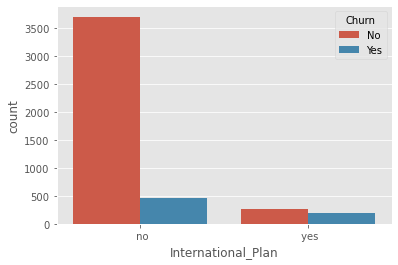

In [37]:
sns.countplot(data = data, x = "International_Plan", hue = "Churn")

In [38]:
chi_2_test(data,"International_Plan")

p value is 5.1469217589105615e-68
International_Plan and Churn are dependant!


In [39]:
## Does Voice mail plan affect churn? 

In [40]:
chi_2_test(data,"VMail_Plan")

p value is 1.0310215433169948e-13
VMail_Plan and Churn are dependant!


In [41]:
## Does Customer service calls affect Churn?

[Text(0, 0, '1475'),
 Text(0, 0, '835'),
 Text(0, 0, '919'),
 Text(0, 0, '551'),
 Text(0, 0, '130'),
 Text(0, 0, '34'),
 Text(0, 0, '6'),
 Text(0, 0, ''),
 Text(0, 0, '10'),
 Text(0, 0, '1')]

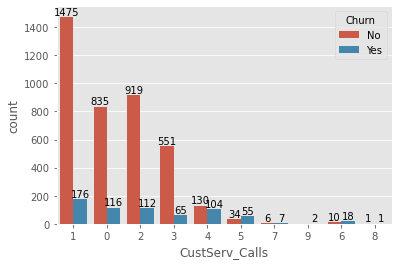

In [42]:
ax = sns.countplot(data = data, x = "CustServ_Calls", hue = "Churn")
ax.bar_label(ax.containers[1])
ax.bar_label(ax.containers[0])

In [43]:
chi_2_test(data,"CustServ_Calls")

p value is 1.1865150956557774e-94
CustServ_Calls and Churn are dependant!


In [44]:
#Since there are also too many unique numbers of customer service calls, we are also going to replace it with a feature that brings as much insight to the model.

In [45]:
chi_2_test(data,"Area_Code")

p value is 0.672816318136138
Area_Code and Churn are independant!


In [46]:
#Although the chi_2 test accepts the Null hypothesis (There is no significant association between the two variables), we are leaving it in for the time being!

In [47]:
data.Churn.replace(['No','Yes'],[0,1],inplace=True,)

In [48]:
data.Churn.value_counts()

0    3961
1     656
Name: Churn, dtype: int64

In [49]:
data1.Churn.value_counts()

No     3961
Yes     656
Name: Churn, dtype: int64

In [50]:
data.Churn.value_counts()

0    3961
1     656
Name: Churn, dtype: int64

In [51]:
data.Churn.mean()

0.14208360407190818

In [52]:
data.Churn.value_counts()

0    3961
1     656
Name: Churn, dtype: int64

In [53]:
data[data["Churn"] == 1].mean()

Account_Length         inf
Area_Code              inf
VMail_Message          inf
Day_Calls              inf
Eve_Calls              inf
Night_calls            inf
International_Calls    inf
CustServ_Calls         inf
Churn                  1.0
dtype: float64

array([[<AxesSubplot:title={'center':'Account_Length'}>,
        <AxesSubplot:title={'center':'Area_Code'}>,
        <AxesSubplot:title={'center':'VMail_Message'}>,
        <AxesSubplot:title={'center':'Day_Mins'}>],
       [<AxesSubplot:title={'center':'Day_Calls'}>,
        <AxesSubplot:title={'center':'Day_Charge'}>,
        <AxesSubplot:title={'center':'Eve_Mins'}>,
        <AxesSubplot:title={'center':'Eve_Calls'}>],
       [<AxesSubplot:title={'center':'Eve_Charge'}>,
        <AxesSubplot:title={'center':'Night_Mins'}>,
        <AxesSubplot:title={'center':'Night_calls'}>,
        <AxesSubplot:title={'center':'Night_Charge'}>],
       [<AxesSubplot:title={'center':'International_Mins'}>,
        <AxesSubplot:title={'center':'International_Calls'}>,
        <AxesSubplot:title={'center':'International_Charge'}>,
        <AxesSubplot:title={'center':'CustServ_Calls'}>]], dtype=object)

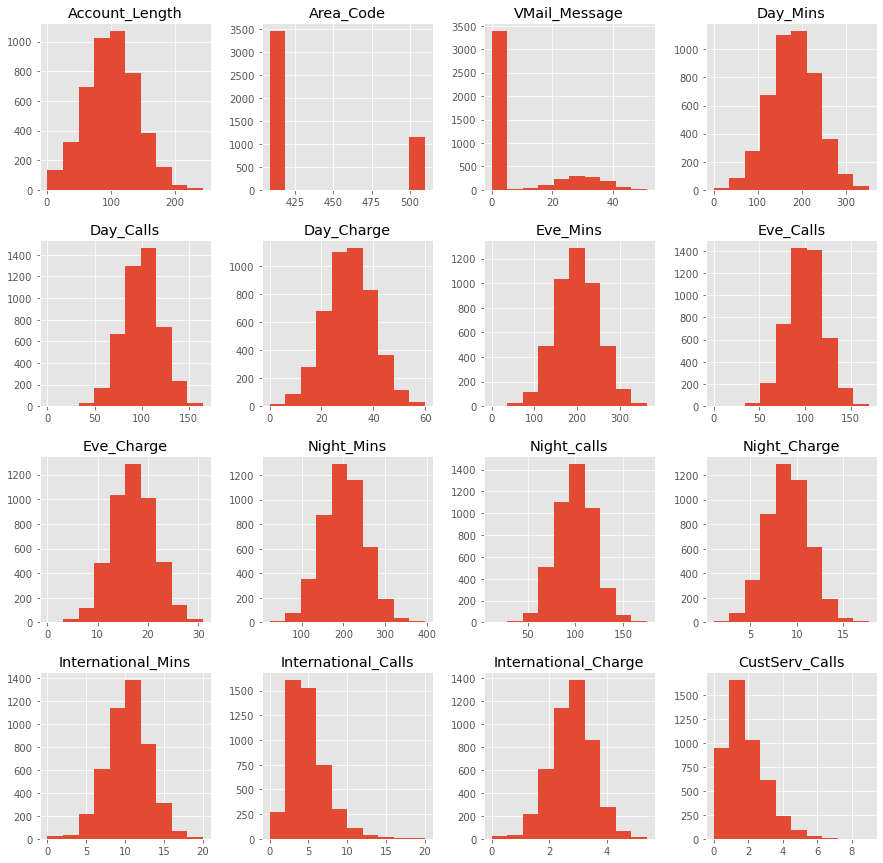

In [54]:
data1.hist(figsize=(15,15))



In [55]:
data.sort_values(by="Day_Charge", ascending=False).head()

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_calls,Night_Charge,International_Mins,International_Calls,International_Charge,CustServ_Calls,Churn
1351,LA,13,415,388-9653,no,no,0,58.4,121,9.93,262.2,64,22.29,159,115,7.15,11.9,5,3.21,1,0
2973,NE,95,510,391-2334,no,no,0,58.2,96,9.89,202.1,126,17.18,210.5,97,9.47,10.4,5,2.81,0,0
181,AK,126,415,372-3750,no,no,0,58.2,94,9.89,138.7,118,11.79,136.8,91,6.16,11.9,1,3.21,5,1
2859,WV,87,415,415-3158,no,no,0,58,125,9.86,67.5,116,5.74,185.9,136,8.37,11.5,3,3.11,0,0
603,MI,53,415,346-5707,no,no,0,57.5,95,9.78,265.5,131,22.57,244.3,128,10.99,11.6,6,3.13,3,0


## EDA

#### Univariate Anlysis

In [56]:
#seperating categorical and numarical data for ploting 
categorical_data=data1[['State','Area_Code','International_Plan','VMail_Plan','Churn']]
numeric_data=data1[['Account_Length','VMail_Message','Day_Mins','Day_Calls','Day_Charge','Eve_Mins','Eve_Calls','Eve_Charge','Night_Mins','Night_calls','Night_Charge','International_Mins','International_Calls','International_Charge','CustServ_Calls']]

In [57]:
numeric_data=data1[['Account_Length','VMail_Message','Day_Mins','Day_Calls','Day_Charge','Eve_Mins','Eve_Calls','Eve_Charge','Night_Mins','Night_calls','Night_Charge','International_Mins','International_Calls','International_Charge','CustServ_Calls']]

In [58]:
categorical_data.head(5)

,State,Area_Code,International_Plan,VMail_Plan,Churn
0,KS,415,no,yes,No
1,OH,415,no,yes,No
2,NJ,415,no,no,No
3,OH,408,yes,no,No
4,OK,415,yes,no,No


In [59]:
numeric_data.head(5)

,Account_Length,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_calls,Night_Charge,International_Mins,International_Calls,International_Charge,CustServ_Calls
0,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


                                             |                                             | [  0%]   00:00 ->…


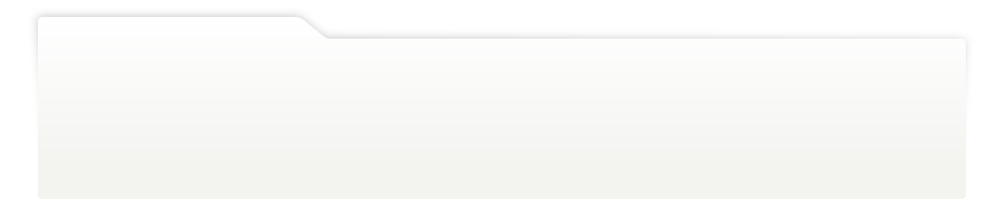
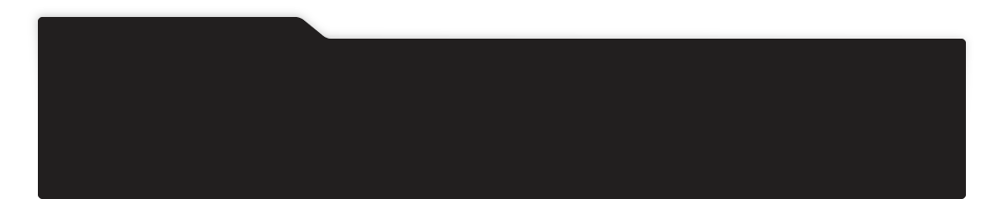
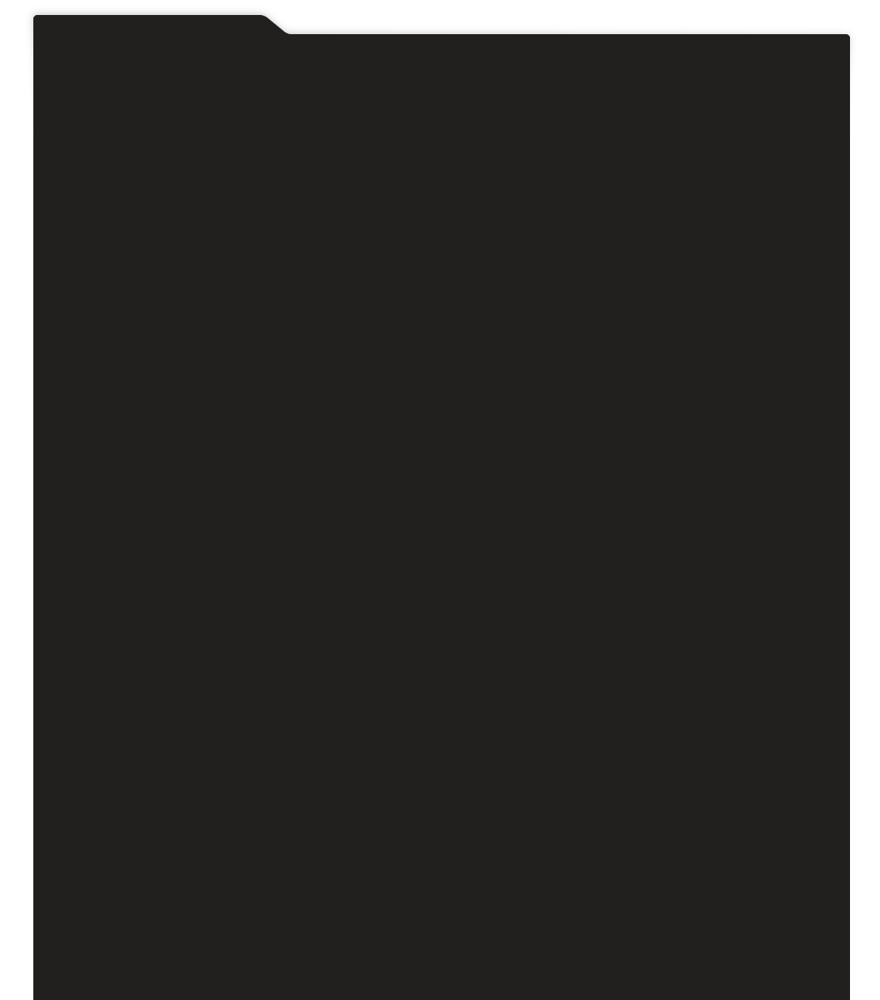
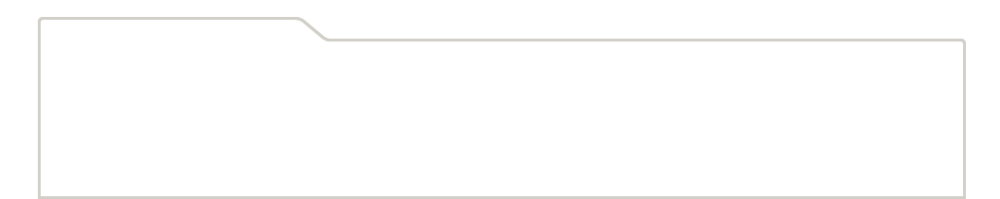
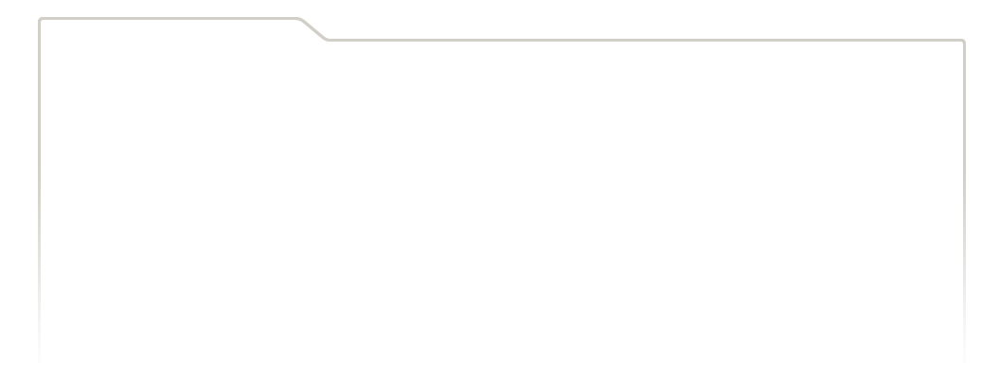
...
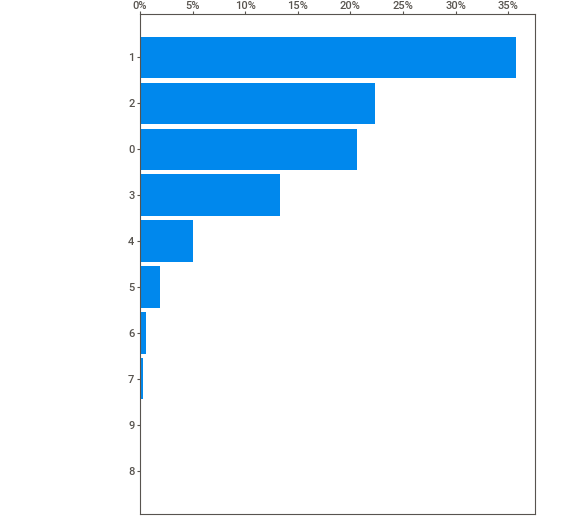
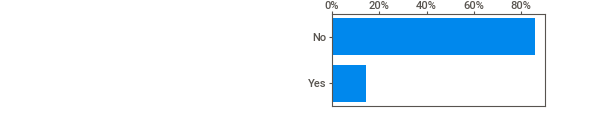
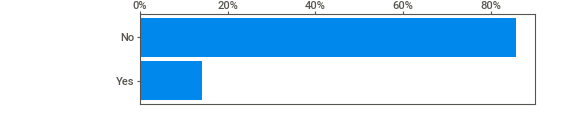
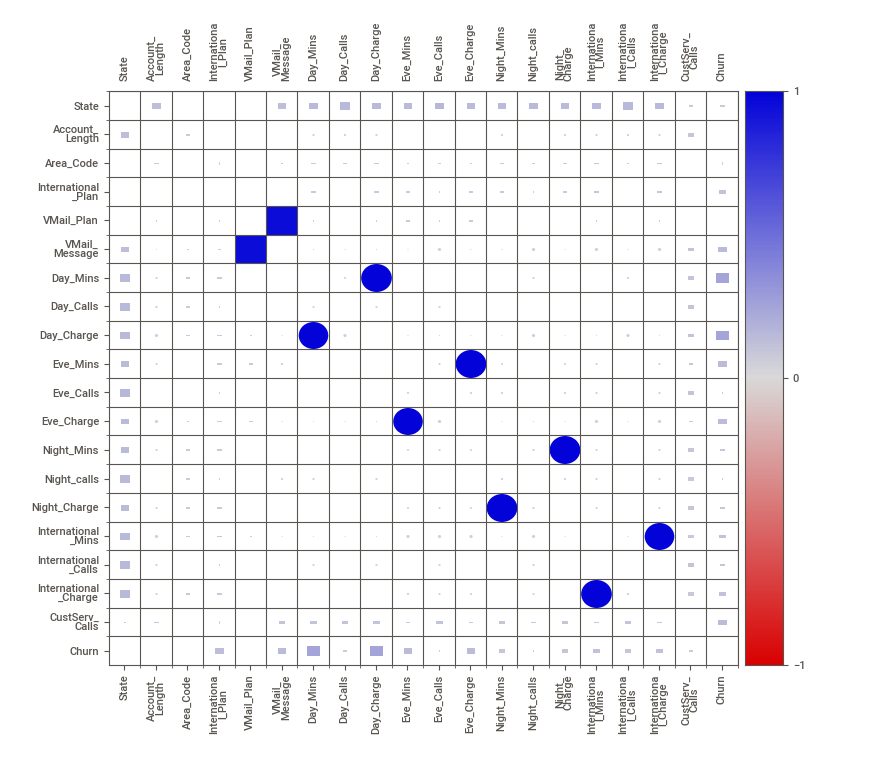
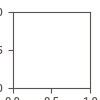

In [60]:
#!pip install sweetviz  
#Automated Library for visualization

import sweetviz as sv #  library for univariant analysis
my_report = sv.analyze(data1)## pass the original dataframe
my_report.show_notebook()

## Churn Flag

In [61]:
data1['Churn'].value_counts()

No     3961
Yes     656
Name: Churn, dtype: int64

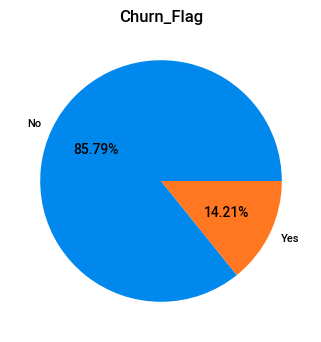

In [62]:
Churn_index=data1.Churn.value_counts().index
plt.title("Churn_Flag")
plt.pie(data1.Churn.value_counts(),labels=Churn_index\
       ,autopct='%1.2f%%',)
plt.show()

In [63]:
#Observation:In Target Feature the 85.79% people not Migrateing and 14.21% pepole are leaving the network

<AxesSubplot:xlabel='Churn', ylabel='count'>

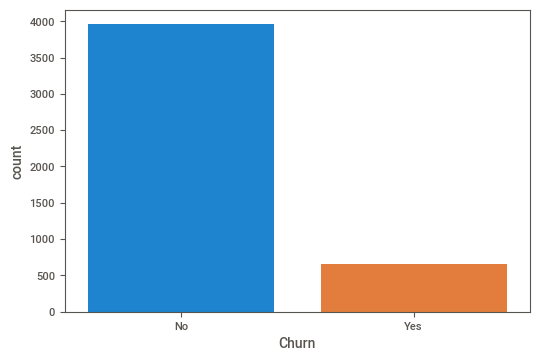

In [64]:
#visulazing target feature
sns.countplot(data1['Churn'])

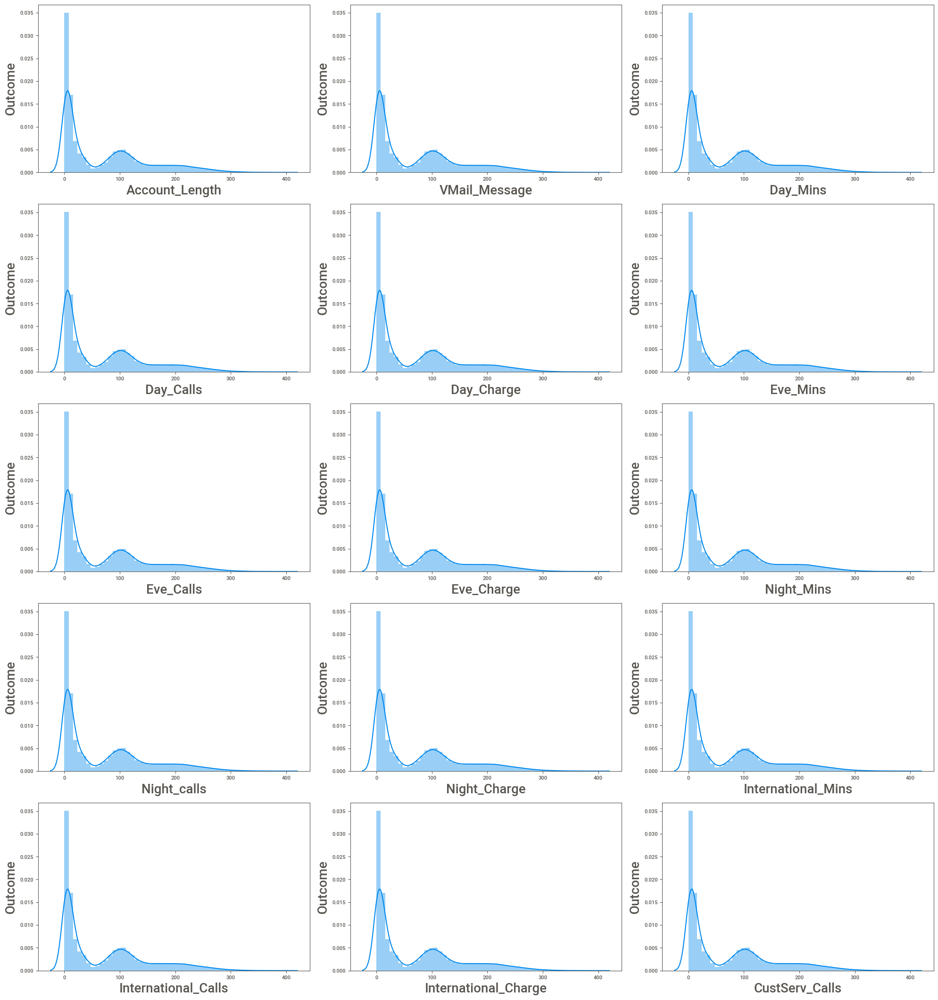

In [65]:
plt.figure(figsize=(20,25), facecolor='white')#To set canvas 
plotnumber = 1#counter

for column in numeric_data:#accessing the columns 
    if plotnumber<=17 :
        ax = plt.subplot(6,3,plotnumber)
        sns.distplot(x=numeric_data )
        plt.xlabel(column,fontsize=20)#assign name to x-axis and set font-20
        plt.ylabel('Outcome',fontsize=20)
    plotnumber+=1#counter increment
plt.tight_layout()

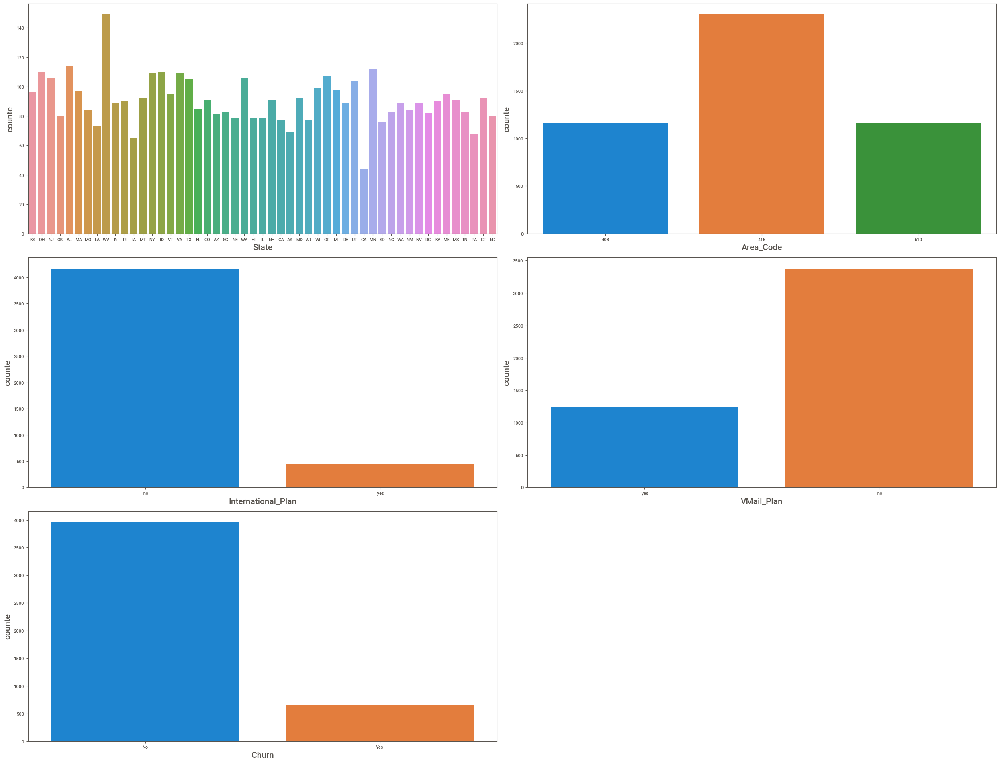

In [66]:
plt.figure(figsize=(25,25), facecolor='white')#To set canvas 
plotnumber = 1#counter

for column in categorical_data:#accessing the catogorical columns 
    if plotnumber<=6 :
        ax = plt.subplot(4,2,plotnumber)
        sns.countplot(x=categorical_data[column])
        plt.xlabel(column,fontsize=15)#assign name to x-axis and set font-20
        plt.ylabel('counte',fontsize=15)
    plotnumber+=1#counter increment
plt.tight_layout()

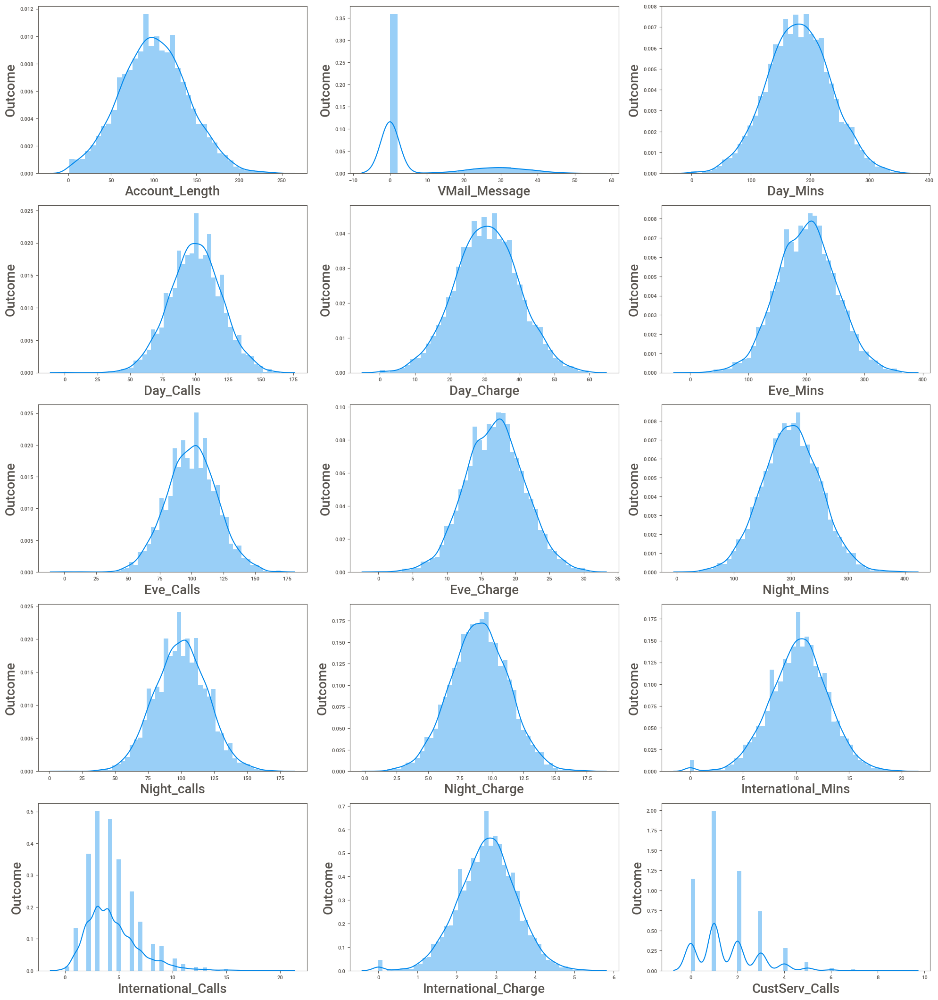

In [67]:
plt.figure(figsize=(20,25), facecolor='white')#To set canvas 
plotnumber = 1#counter

for column in numeric_data:#accessing the columns 
    if plotnumber<=17 :
        ax = plt.subplot(6,3,plotnumber)
        sns.distplot(x=numeric_data[column]  )
        plt.xlabel(column,fontsize=20)#assign name to x-axis and set font-20
        plt.ylabel('Outcome',fontsize=20)
    plotnumber+=1#counter increment
plt.tight_layout()

In [68]:
### The histogram shows the distribution of data and we can say that it is quite normal, while few are skewed.

In [69]:
data1.skew()

Account_Length          0.106248
Area_Code               1.135333
VMail_Message           1.326734
Day_Mins               -0.002948
Day_Calls              -0.081013
Day_Charge             -0.002952
Eve_Mins               -0.005280
Eve_Calls              -0.017554
Eve_Charge             -0.005252
Night_Mins              0.020515
Night_calls             0.030886
Night_Charge            0.020507
International_Mins     -0.220891
International_Calls     1.366420
International_Charge   -0.221342
CustServ_Calls          1.046800
dtype: float64

In [70]:
### Skew

In [71]:
data1.kurtosis()

Account_Length         -0.092552
Area_Code              -0.686039
VMail_Message           0.123526
Day_Mins               -0.042399
Day_Calls               0.196147
Day_Charge             -0.042264
Eve_Mins                0.043630
Eve_Calls               0.135980
Eve_Charge              0.043522
Night_Mins              0.061409
Night_calls             0.068815
Night_Charge            0.061380
International_Mins      0.671602
International_Calls     3.302927
International_Charge    0.672518
CustServ_Calls          1.515026
dtype: float64

In [72]:
### Kurtosis tells about the sharpness or taileness the curve

### BIVARIANCE

In [73]:
import warnings
warnings.filterwarnings("ignore")

#### Categorical  plot

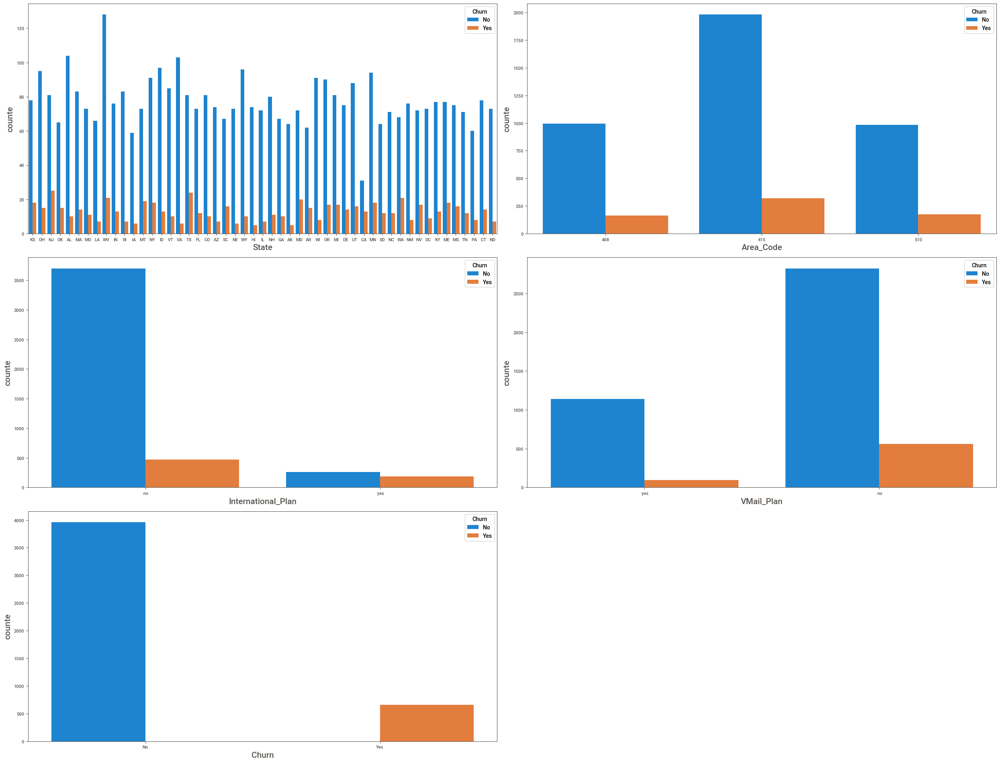

In [74]:
plt.figure(figsize=(25,25), facecolor='white')#To set canvas 
plotnumber = 1#counter

for column in categorical_data:#accessing the columns 
    if plotnumber<=6 :
        ax = plt.subplot(4,2,plotnumber)
        sns.countplot(x=categorical_data[column]
                        ,hue=data1.Churn)
        plt.xlabel(column,fontsize=15)#assign name to x-axis and set font-20
        plt.ylabel('counte',fontsize=15)
    plotnumber+=1#counter increment
plt.tight_layout()

In [75]:
#### Numerical Plot

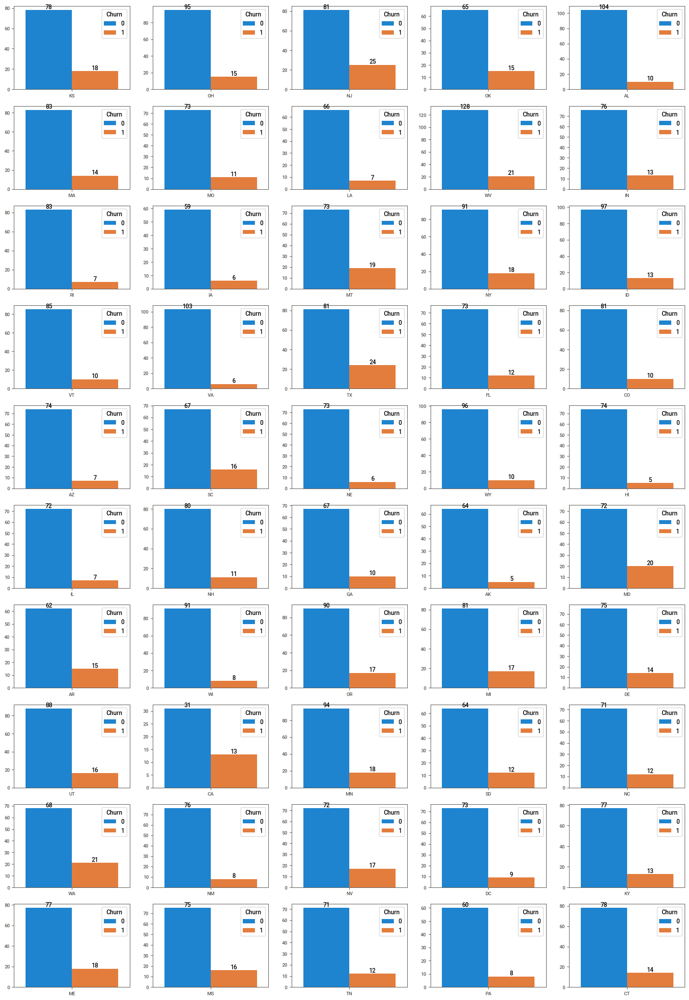

In [76]:
fig, axes = plt.subplots(10,5,figsize = (20,30))
for i in range(len(data.State.unique())-1): 
    # filter for that state 
    state_data = data[data.State == data.State.unique()[i]]
    sns.countplot(data = state_data, x = "State", hue = "Churn", ax = axes[i//5,i%5])
    axes[i//5,i%5].bar_label(axes[i//5,i%5].containers[1])
    axes[i//5,i%5].bar_label(axes[i//5,i%5].containers[0])
    axes[i//5,i%5].set_ylabel("")
    axes[i//5,i%5].set_xlabel("")

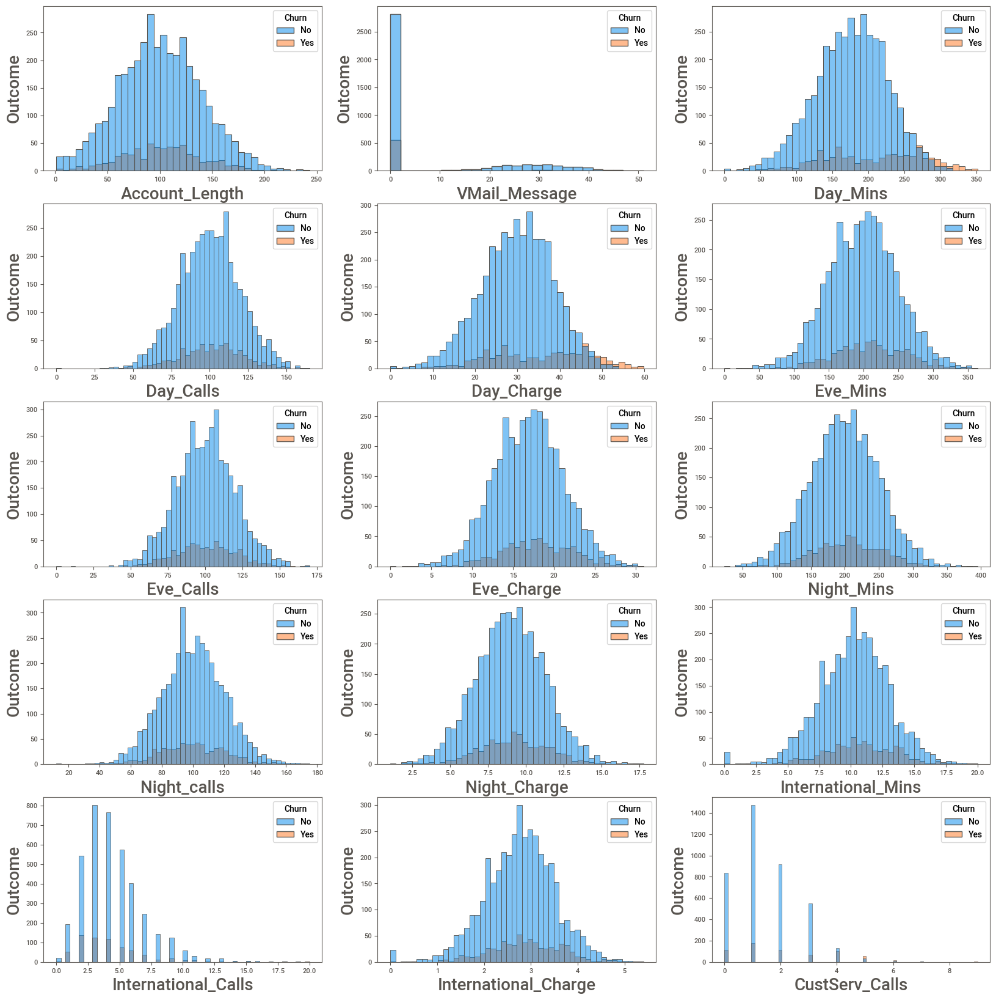

In [77]:
plt.figure(figsize=(20,25), facecolor='white')#To set canvas 
plotnumber = 1#counter

for column in numeric_data:#accessing the columns 
    if plotnumber<=17 :
        plt.subplot(6,3,plotnumber)
        sns.histplot(x=numeric_data[column],hue=data1.Churn)
        plt.xlabel(column,fontsize=20)#assign name to x-axis and set font-20
        plt.ylabel('Outcome',fontsize=20)
    plotnumber+=1#counter increment

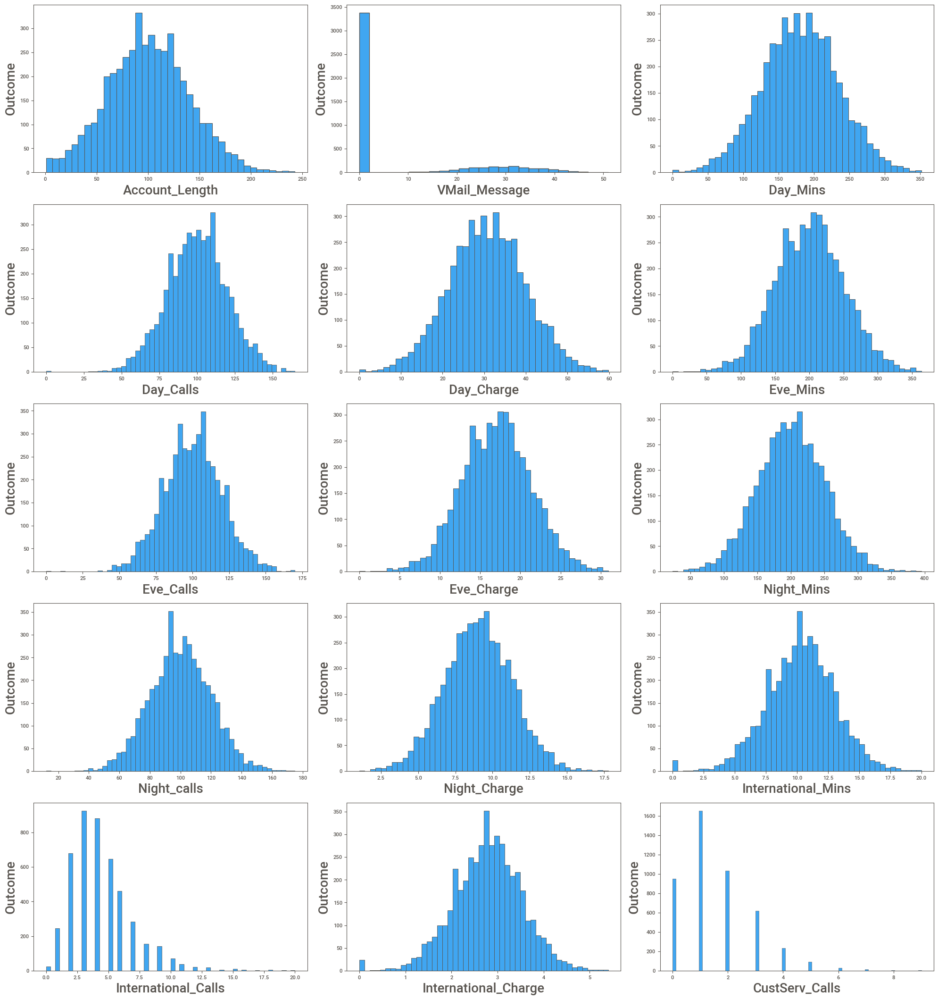

In [78]:
plt.figure(figsize=(20,25), facecolor='white')#To set canvas 
plotnumber = 1#counter
for column in numeric_data:#accessing the columns 
    if plotnumber<=17 :
        ax = plt.subplot(6,3,plotnumber)
        sns.histplot(x=numeric_data[column]  )
        plt.xlabel(column,fontsize=20)#assign name to x-axis and set font-20
        plt.ylabel('Outcome',fontsize=20)
    plotnumber+=1#counter increment
plt.tight_layout()

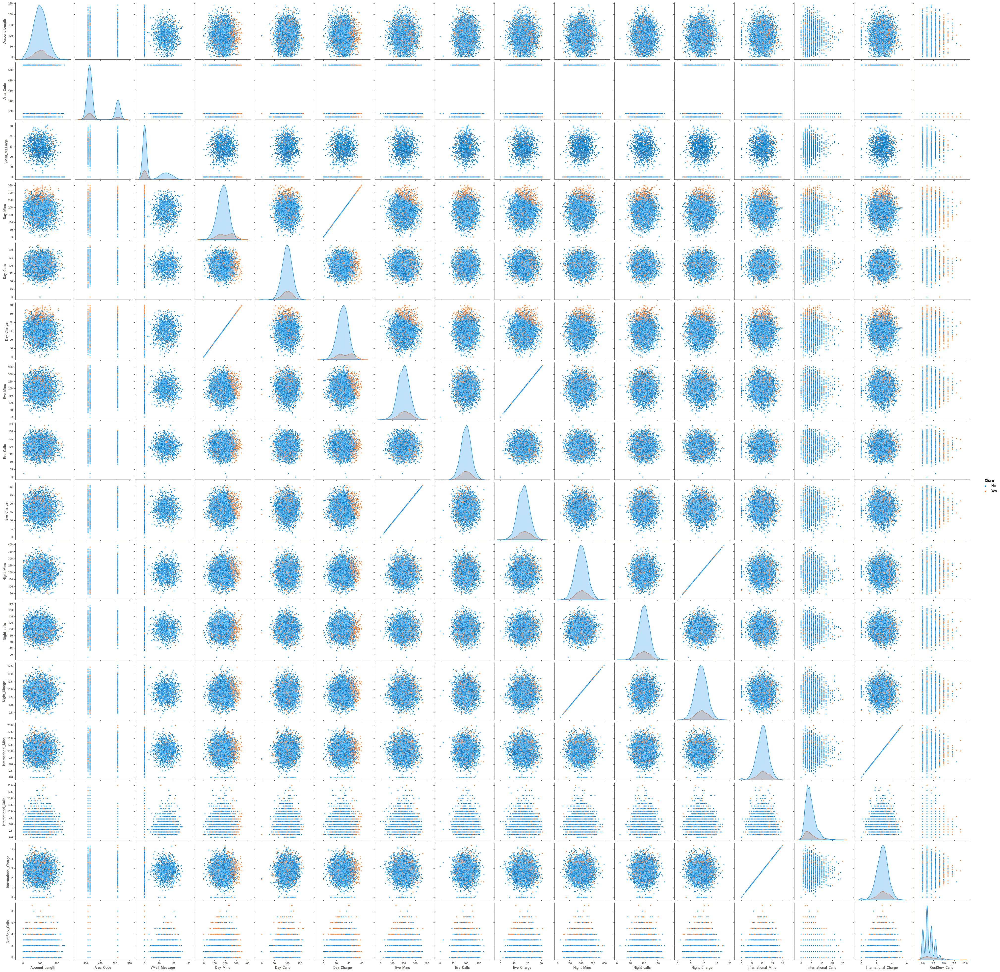

In [80]:
sns.pairplot(data1,hue="Churn")

#### Correlation Checking

In [82]:
corr=data1.corr()

<AxesSubplot:>

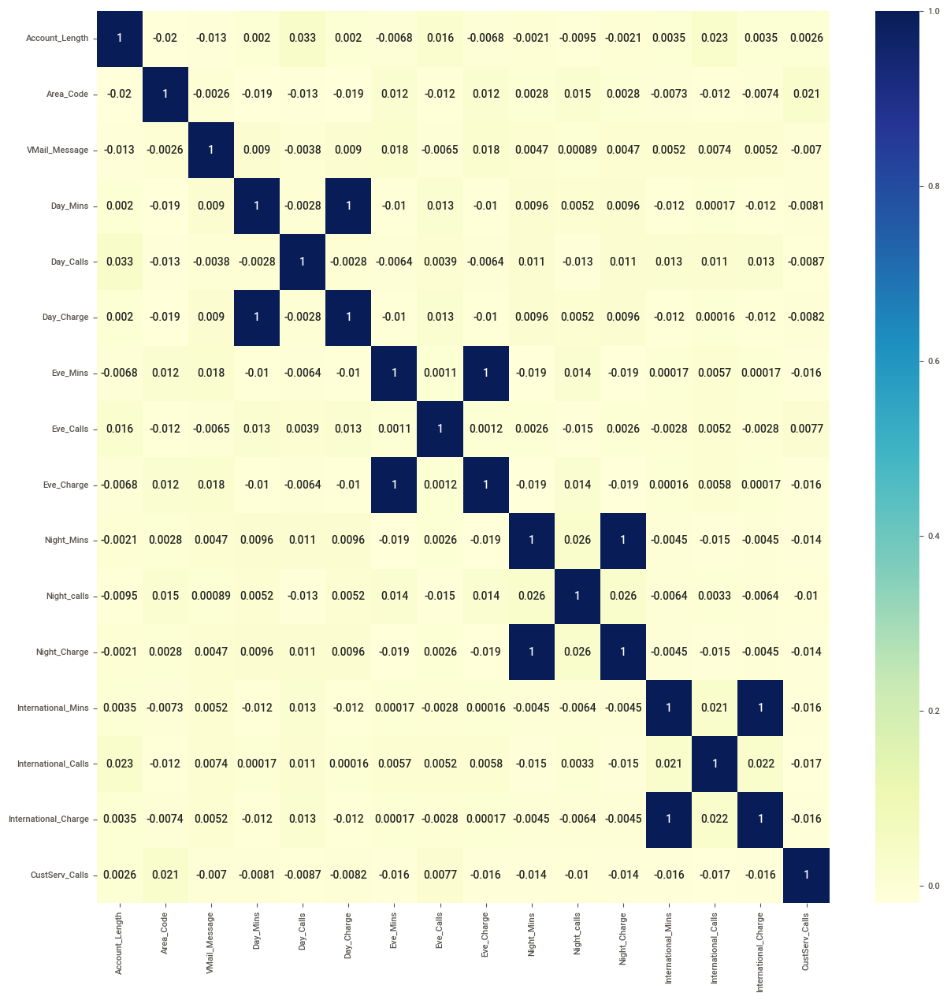

In [83]:
plt.figure(figsize=(15,15))
sns.heatmap(corr,cmap="YlGnBu",annot=True)

In [84]:
#In correltaion there are some features are highly correlated with other features so remove one of the the features 

In [85]:
#hence we'll drop them (Day_mins,Eve_mins,Night_mins,International_mins)

In [86]:
## Outlier detecting and removing

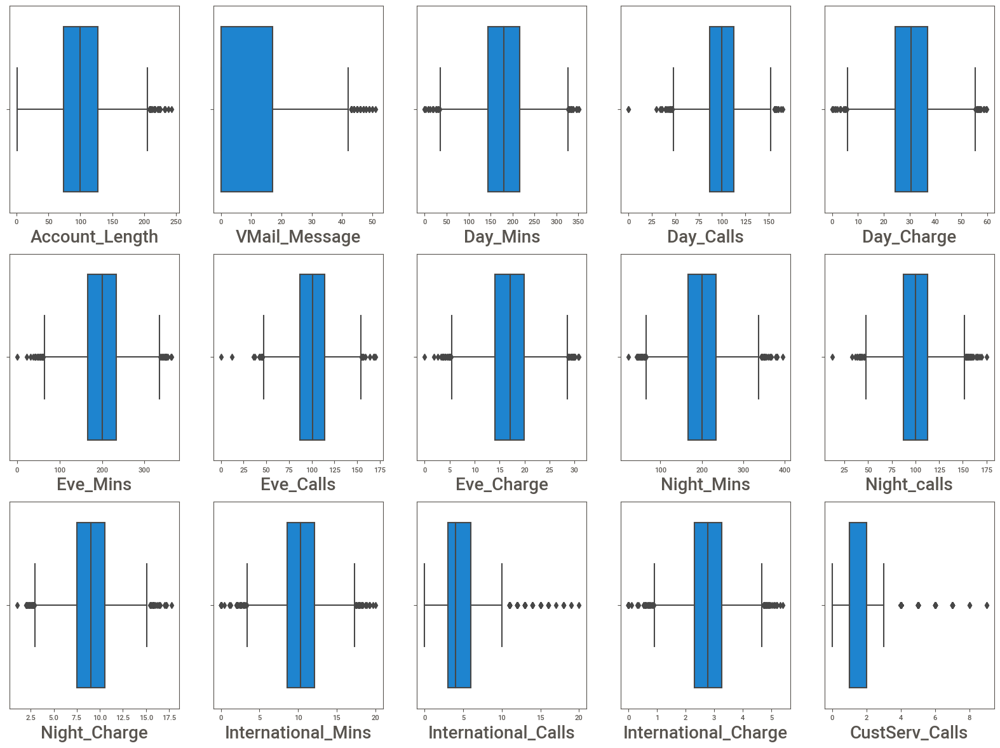

In [87]:
# Checking for outliers
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in numeric_data :
    if plotnumber<=21 :
        ax = plt.subplot(5,5,plotnumber)
        sns.boxplot(numeric_data[column]) 
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

In [88]:
#each numerical data have some outliers 

In [89]:
def drop_outliers(data,name):
    q1,q3=np.percentile(data,[25,75])
    iqr=q3-q1
    lower_fence=q1-(1.5*iqr)
    upper_fence=q3+(1.5*iqr)
    data1.drop(data1[data<=lower_fence].index, inplace = True)
    data1.drop(data1[data>=upper_fence].index,inplace=True)
    print('The outliers in {} is removed:'.format(name))
    print(lower_fence,upper_fence)
    return 

In [90]:
numeric_data1=data1[['Account_Length','Day_Calls','Day_Charge','Eve_Calls','Eve_Charge','Night_calls','Night_Charge','International_Calls','International_Charge','CustServ_Calls']]
for column in numeric_data1:
    drop_outliers(data1[column],column)

The outliers in Account_Length is removed:
-5.5 206.5
The outliers in Day_Calls is removed:
48.0 152.0
The outliers in Day_Charge is removed:
5.860000000000003 55.459999999999994
The outliers in Eve_Calls is removed:
46.5 154.5
The outliers in Eve_Charge is removed:
5.520000000000001 28.5
The outliers in Night_calls is removed:
45.5 153.5
The outliers in Night_Charge is removed:
2.9412499999999993 15.151250000000001
The outliers in International_Calls is removed:
-1.5 10.5
The outliers in International_Charge is removed:
0.8949999999999996 4.695
The outliers in CustServ_Calls is removed:
-0.5 3.5


<AxesSubplot:xlabel='CustServ_Calls'>

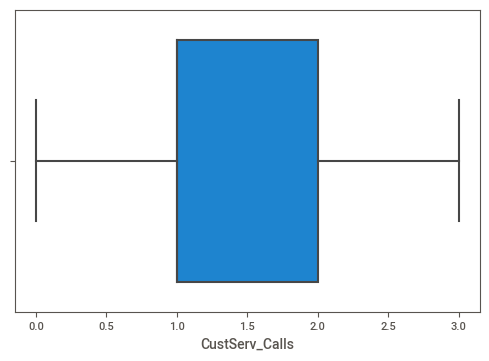

In [91]:
sns.boxplot(data1.CustServ_Calls)

In [92]:
numeric_data1=data1[['Day_Mins','Eve_Mins','Night_Mins','International_Mins','Account_Length','Day_Calls','Day_Charge','Eve_Calls','Eve_Charge','Night_calls','Night_Charge','International_Calls','International_Charge','CustServ_Calls']]

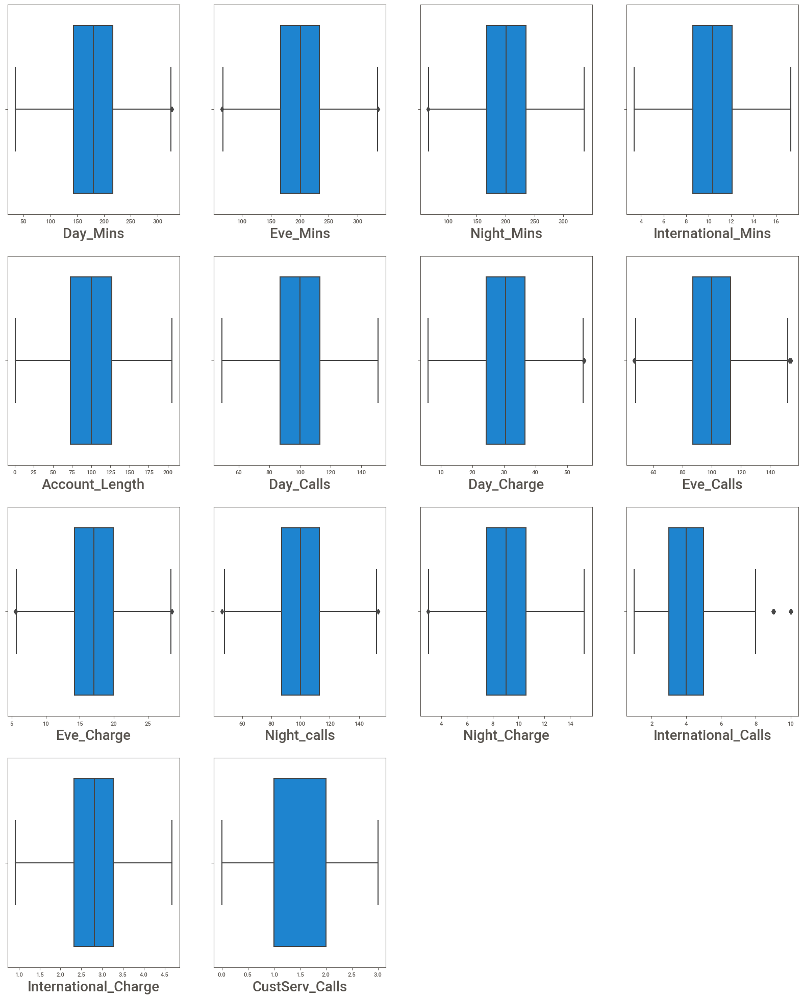

In [93]:
# Checking for outliers
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in numeric_data1 :
    if plotnumber<=21 :
        ax = plt.subplot(4,4,plotnumber)
        sns.boxplot(numeric_data1[column]) 
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

In [94]:
#install Sklearn
#!pip install sklearn

In [95]:
#import LableEncoder
from sklearn.preprocessing import LabelEncoder

### converting catogorical to numarical

In [96]:
le = LabelEncoder()

In [97]:
#Internatinal plan
data1['International_Plan']=le.fit_transform(data1['International_Plan'])
#state
data1['State']=le.fit_transform(data1['State'])
#Internatinal plan
data1['International_Plan']=le.fit_transform(data1['International_Plan'])
#vmail,area code, Churn
data1['VMail_Plan']=le.fit_transform(data1['VMail_Plan'])
data1.Area_Code.replace([408,415,510],[0,1,2],inplace=True,)
data1.Churn.replace(['No','Yes'],[0,1],inplace=True,)
data1.Churn.value_counts()





0    3480
1     410
Name: Churn, dtype: int64

In [98]:
data1=data1.astype({"Day_Charge":"int64",'State':'int64','International_Plan':'int64','VMail_Plan':'int64','Eve_Charge':'int64'\
               ,'Night_Charge':'int64','International_Charge':'int64','Churn':'int64'})

In [99]:
data1.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3890 entries, 0 to 4616
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 3890 non-null   int64  
 1   Account_Length        3890 non-null   int64  
 2   Area_Code             3890 non-null   int64  
 3   International_Plan    3890 non-null   int64  
 4   VMail_Plan            3890 non-null   int64  
 5   VMail_Message         3890 non-null   int64  
 6   Day_Mins              3890 non-null   float64
 7   Day_Calls             3890 non-null   int64  
 8   Day_Charge            3890 non-null   int64  
 9   Eve_Mins              3890 non-null   float64
 10  Eve_Calls             3890 non-null   int64  
 11  Eve_Charge            3890 non-null   int64  
 12  Night_Mins            3890 non-null   float64
 13  Night_calls           3890 non-null   int64  
 14  Night_Charge          3890 non-null   int64  
 15  International_Mins   

<AxesSubplot:>

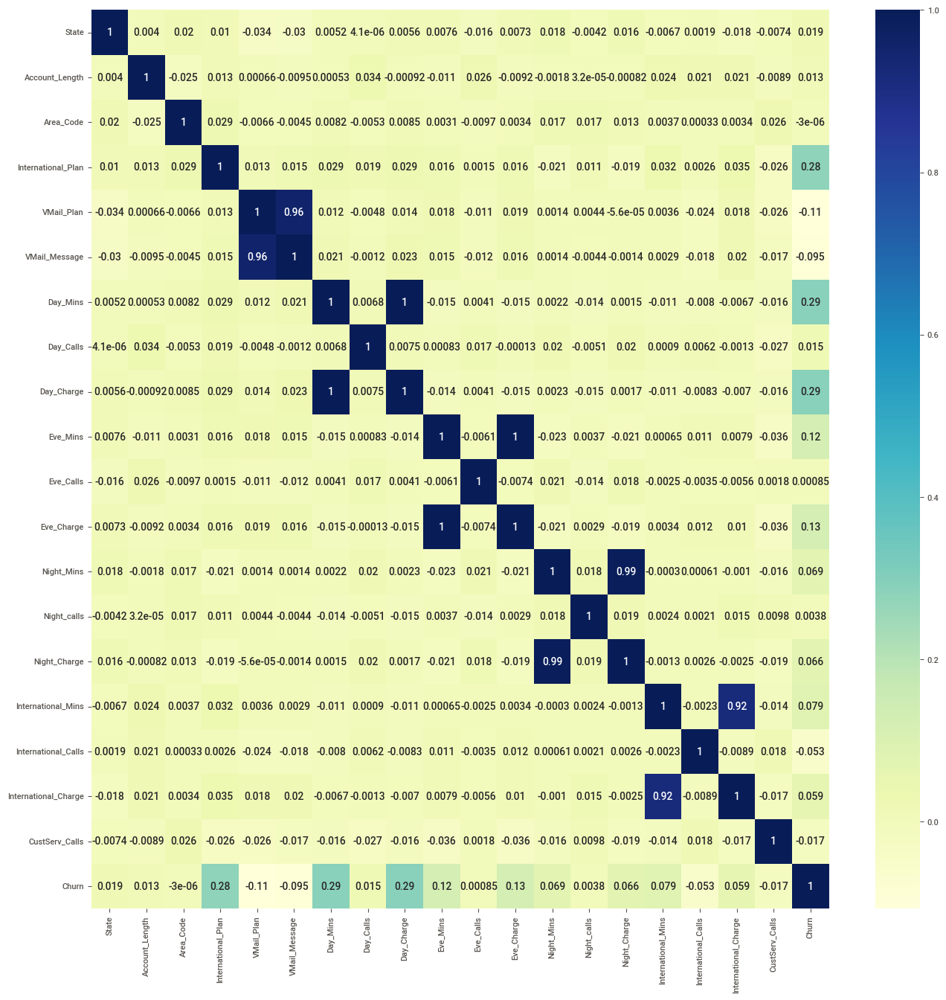

In [100]:
#checking correlation once again
plt.figure(figsize=(16,16))
corr=data1.corr()
sns.heatmap(corr,annot=True,cmap='YlGnBu')

In [101]:
data1.columns

Index(['State', 'Account_Length', 'Area_Code', 'International_Plan',
       'VMail_Plan', 'VMail_Message', 'Day_Mins', 'Day_Calls', 'Day_Charge',
       'Eve_Mins', 'Eve_Calls', 'Eve_Charge', 'Night_Mins', 'Night_calls',
       'Night_Charge', 'International_Mins', 'International_Calls',
       'International_Charge', 'CustServ_Calls', 'Churn'],
      dtype='object')

In [102]:
data1.head()

,State,Account_Length,Area_Code,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_calls,Night_Charge,International_Mins,International_Calls,International_Charge,CustServ_Calls,Churn
0,16,128,1,0,1,25,265.1,110,45,197.4,99,16,244.7,91,11,10.0,3,2,1,0
1,35,107,1,0,1,26,161.6,123,27,195.5,103,16,254.4,103,11,13.7,3,3,1,0
2,31,137,1,0,0,0,243.4,114,41,121.2,110,10,162.6,104,7,12.2,5,3,0,0
4,36,75,1,1,0,0,166.7,113,28,148.3,122,12,186.9,121,8,10.1,3,2,3,0
5,1,118,2,1,0,0,223.4,98,37,220.6,101,18,203.9,118,9,6.3,6,1,0,0


In [103]:
data1.drop(['VMail_Message'],axis=1,inplace=True)


In [104]:
d2=data1.loc[data1['Churn']==1]

In [105]:
#Removal of variables with high correlation.
data.drop(['Day_Mins','Eve_Mins','Night_Mins','International_Mins'],axis=1,inplace=True)

In [106]:
data1.drop(['Day_Mins','Eve_Mins','Night_Mins','International_Mins'],axis=1,inplace=True)

In [107]:
### dependent and independent variable saperation

In [108]:
X=data1.drop(labels='Churn',axis=1)
y=data1['Churn']

In [109]:
X1=X.copy()
y1=y.copy()

In [110]:
X.value_counts()

State  Account_Length  Area_Code  International_Plan  VMail_Plan  Day_Calls  Day_Charge  Eve_Calls  Eve_Charge  Night_calls  Night_Charge  International_Calls  International_Charge  CustServ_Calls
0      1               0          0                   0           74         29          79         12          109          10            3                    1                     1                 1
35     75              1          0                   0           99         25          83         25          104          7             5                    2                     0                 1
34     181             1          1                   0           83         27          83         10          98           11            3                    3                     0                 1
35     4               1          1                   0           96         28          94         11          86           11            4                    3                     0              

In [111]:
y.value_counts()

0    3480
1     410
Name: Churn, dtype: int64

## case 1

In [112]:
##  Feature Importance

In [113]:
# uning ExtraTreesClassifieries
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model=ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [114]:
print(model.feature_importances_)

[0.05898428 0.05913876 0.03383522 0.09448402 0.02999542 0.05900764
 0.22220415 0.06041607 0.09207267 0.06059208 0.06050608 0.08179338
 0.04732989 0.03964035]


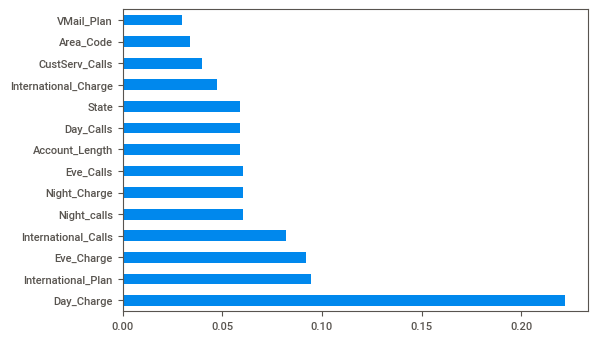

In [115]:
ranked_features=pd.Series(model.feature_importances_,index=X.columns)
ranked_features.nlargest(15).plot(kind='barh')
plt.show()

In [116]:
#The above plot the day_charmge and international plan, Eve charge Internatinal calls are most importent features compare to others 

In [117]:
#The above plot the day_charmge and international plan, Eve charge Internatinal calls are most importent features compare to others 

In [118]:
# converting  Imbalanced data in to balanced data

In [119]:
#the Churn 'Yes','NO' are imbalanced so we conver them to balanced data and we use smote techinqe

In [120]:
# !pip install imblearn

In [121]:
from imblearn.over_sampling import SMOTE
sm=SMOTE(sampling_strategy="minority") 
X_sm,y_sm=sm.fit_resample(X,y)

In [122]:
print(X_sm.shape)
print(y_sm.shape)

(6960, 14)
(6960,)


In [123]:

#Splitting data into train and test

In [124]:
from sklearn.model_selection import train_test_split

In [125]:
X_train,X_test,y_train,y_test=train_test_split(X_sm,y_sm,test_size=.25,random_state=32) 

In [126]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# X_train=scaler.fit_transform(X_train)
# X_test=scaler.fit_transform(X_test)

In [127]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(5220, 14)
(1740, 14)
(5220,)
(1740,)


### Applying defferent models/algorithems

### Logistic Regression

In [128]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

In [129]:
model_1=LogisticRegression(C=0.1, max_iter=400, random_state=50) #used hypaparameter tuning and get parameters 

In [130]:
model_1.fit(X_train,y_train)
y_train_predict=model_1.predict(X_train)
y_test_predict=model_1.predict(X_test)

from sklearn.metrics import accuracy_score,classification_report
print('train accuracy:',accuracy_score(y_train,y_train_predict))
print('test accuracy:',accuracy_score(y_test,y_test_predict))
print(classification_report(y_test,y_test_predict))


train accuracy: 0.7810344827586206
test accuracy: 0.7988505747126436
              precision    recall  f1-score   support

           0       0.82      0.78      0.80       889
           1       0.78      0.82      0.80       851

    accuracy                           0.80      1740
   macro avg       0.80      0.80      0.80      1740
weighted avg       0.80      0.80      0.80      1740



In [131]:
pd.crosstab(y_test,y_test_predict)

col_0,0,1
Churn,,
0,694,195
1,155,696


In [132]:
y_test_predict[0:5]

array([1, 1, 0, 0, 1], dtype=int64)

In [133]:
 preds=pd.DataFrame(y_test_predict,columns=['Churn_Flag'])

In [134]:
predictions = model_1.predict_proba(X_test)
predictions[0:5]

array([[0.0699317 , 0.9300683 ],
       [0.49785017, 0.50214983],
       [0.91454331, 0.08545669],
       [0.79752747, 0.20247253],
       [0.1359083 , 0.8640917 ]])

In [135]:
predictions = model_1.predict_proba(X_test)
predictions[0:5]

array([[0.0699317 , 0.9300683 ],
       [0.49785017, 0.50214983],
       [0.91454331, 0.08545669],
       [0.79752747, 0.20247253],
       [0.1359083 , 0.8640917 ]])

In [136]:
y_test.head(5)

4304    1
2711    0
3329    0
3927    1
5684    1
Name: Churn, dtype: int64

In [137]:
roc_score=roc_auc_score(y_test,y_test_predict)

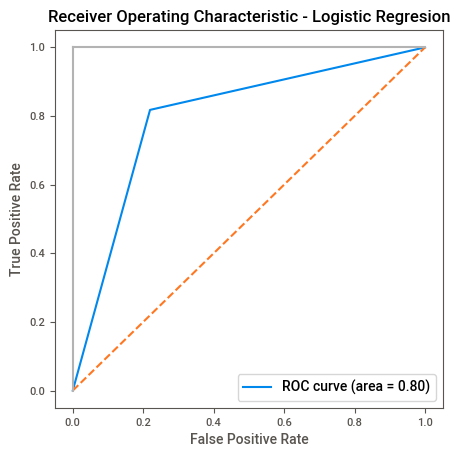

In [138]:
false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test, y_test_predict)
plt.subplots(1, figsize=(5,5))
plt.title('Receiver Operating Characteristic - Logistic Regresion')
plt.plot(false_positive_rate1, true_positive_rate1,label="ROC curve (area = %0.2f)" % roc_score)
plt.legend(loc="lower right")
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


###     KNN (K-nearest Neighbor )

In [139]:
from sklearn.neighbors import KNeighborsClassifier

In [140]:
model_2=KNeighborsClassifier(n_neighbors=2)#n_neighbors=100
model_2.fit(X_train,y_train)

y_predict=model_2.predict(X_test)
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.96      0.85      0.91       889
           1       0.86      0.97      0.91       851

    accuracy                           0.91      1740
   macro avg       0.91      0.91      0.91      1740
weighted avg       0.92      0.91      0.91      1740



In [141]:
pd.crosstab(y_test,y_predict) 

col_0,0,1
Churn,,
0,759,130
1,28,823


In [142]:
y_predict[0:5]

array([1, 0, 0, 1, 1], dtype=int64)

In [143]:
roc_score=roc_auc_score(y_test,y_predict)

In [144]:
predictions = model_2.predict_proba(X_test)
predictions[0:5]

array([[0. , 1. ],
       [0.5, 0.5],
       [1. , 0. ],
       [0. , 1. ],
       [0. , 1. ]])

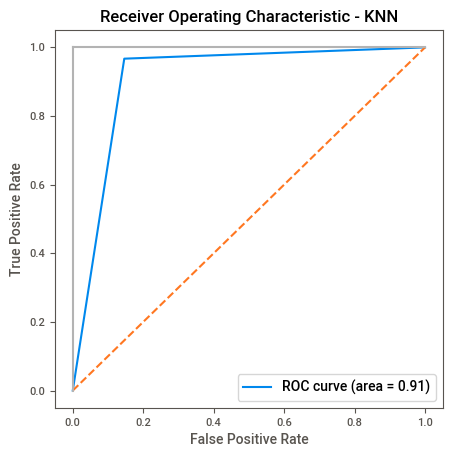

In [145]:
false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test, y_predict)
plt.subplots(1, figsize=(5,5))
plt.title('Receiver Operating Characteristic - KNN')
plt.plot(false_positive_rate1, true_positive_rate1,label="ROC curve (area = %0.2f)" % roc_score)
plt.legend(loc="lower right")
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

###  SVM(SUPPORT VECTOR MACHINE)


In [146]:
from sklearn.svm import SVC

In [147]:
model_3=SVC(probability=True)#kernel='rbf',C=2
model_3.fit(X_train,y_train)

y_predict=model_3.predict(X_test)
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.73      0.74      0.74       889
           1       0.73      0.71      0.72       851

    accuracy                           0.73      1740
   macro avg       0.73      0.73      0.73      1740
weighted avg       0.73      0.73      0.73      1740



In [148]:
pd.crosstab(y_test,y_predict) 

col_0,0,1
Churn,,
0,662,227
1,250,601


In [149]:
pd.crosstab(y_test,y_predict) 

col_0,0,1
Churn,,
0,662,227
1,250,601


In [150]:
y_predict[0:5]

array([1, 1, 0, 0, 0], dtype=int64)

In [151]:
predictions = model_3.predict_proba(X_test)
predictions[0:5]

array([[0.07488066, 0.92511934],
       [0.37805599, 0.62194401],
       [0.57240861, 0.42759139],
       [0.93320359, 0.06679641],
       [0.55968656, 0.44031344]])

In [152]:
roc_score=roc_auc_score(y_test,y_predict)

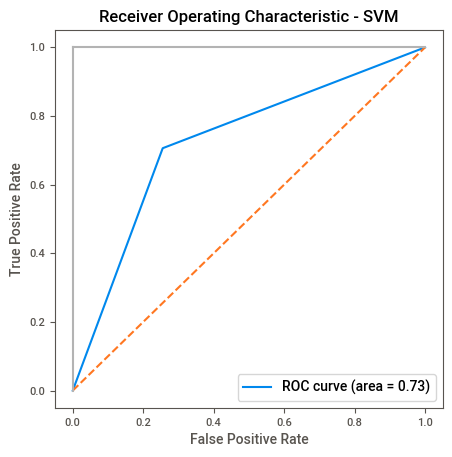

In [153]:
false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test, y_predict)
plt.subplots(1, figsize=(5,5))
plt.title('Receiver Operating Characteristic - SVM')
plt.plot(false_positive_rate1, true_positive_rate1,label="ROC curve (area = %0.2f)" % roc_score)
plt.legend(loc="lower right")
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### DECISION TREE

In [154]:
from sklearn.tree import DecisionTreeClassifier

In [155]:
model_5=DecisionTreeClassifier(max_depth=32)#max_depth=5
model_5.fit(X_train,y_train)

y_predict=model_5.predict(X_test)
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       889
           1       0.83      0.88      0.85       851

    accuracy                           0.85      1740
   macro avg       0.85      0.85      0.85      1740
weighted avg       0.85      0.85      0.85      1740



In [156]:
pd.crosstab(y_test,y_predict) 

col_0,0,1
Churn,,
0,734,155
1,105,746


In [157]:
y_predict[0:5]

array([1, 0, 0, 1, 1], dtype=int64)

In [158]:
predictions = model_5.predict_proba(X_test)


In [159]:
roc_score=roc_auc_score(y_test,y_predict)

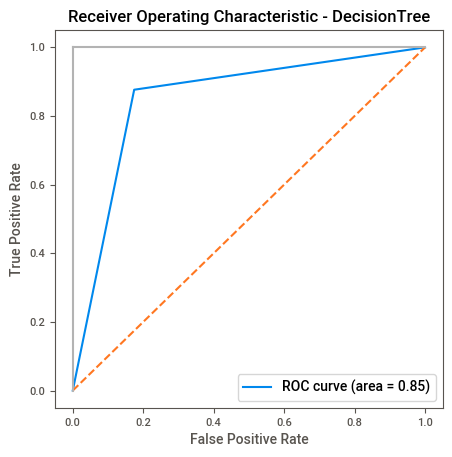

In [160]:
false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test, y_predict)
plt.subplots(1, figsize=(5,5))
plt.title('Receiver Operating Characteristic - DecisionTree')
plt.plot(false_positive_rate1, true_positive_rate1,label="ROC curve (area = %0.2f)" % roc_score)
plt.legend(loc="lower right")
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### XG BOOST 

In [164]:
#!pip install xgboost


In [165]:
import xgboost as xgb

In [166]:

model_4=xgb.XGBClassifier(n_estimators=100,max_depth=38)#n_estimators=100,max_depth=38

In [167]:
# model_4=xgb.XGBClassifier(n_estimators=100,max_depth=38)#n_estimators=27,max_depth=10,)
model_4.fit(X_train,y_train)

y_predict=model_4.predict(X_test)
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       889
           1       0.94      0.93      0.94       851

    accuracy                           0.94      1740
   macro avg       0.94      0.94      0.94      1740
weighted avg       0.94      0.94      0.94      1740



## Goal 2

In [168]:
#Risk scores to drive retention campaign
predictions = model_4.predict_proba(X_test)
for row in predictions[0:10]:
        print('customer churn score is: {:.2f} %'.format(row[1]*100))

customer churn score is: 99.98 %
customer churn score is: 60.27 %
customer churn score is: 0.40 %
customer churn score is: 99.30 %
customer churn score is: 56.33 %
customer churn score is: 0.07 %
customer churn score is: 0.37 %
customer churn score is: 94.77 %
customer churn score is: 99.72 %
customer churn score is: 0.47 %


In [169]:
pd.crosstab(y_test,y_predict) 

col_0,0,1
Churn,,
0,839,50
1,57,794


In [170]:
X_test1=X_test.copy()

## Goal 3

In [171]:
#new churn flag
X_test_flag=X_test.copy()

In [172]:
X_test_flag = pd.DataFrame(X_test_flag, columns=X.columns)
X_test_flag

,State,Account_Length,Area_Code,International_Plan,VMail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_calls,Night_Charge,International_Calls,International_Charge,CustServ_Calls
4304,9,115,1,0,0,107,50,77,20,87,7,2,2,1
2711,48,142,2,0,0,102,39,110,14,120,8,3,2,1
3329,10,108,1,0,1,79,33,99,14,108,12,5,3,1
3927,37,64,0,0,0,74,10,94,18,96,8,4,2,1
5684,37,156,1,1,0,127,24,90,24,83,8,4,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,35,125,0,1,0,86,38,91,22,114,8,1,3,1
2287,20,189,1,0,1,116,26,50,16,108,7,6,4,1
4670,36,88,1,0,0,94,50,113,21,89,13,3,1,1
3735,21,62,2,0,0,100,35,91,19,77,9,5,1,0


In [173]:
X_test_flag['Churn_Flag']=y_predict
X_test_flag.Churn_Flag.replace([0,1],['No','Yes'],inplace=True)

In [174]:
X_test_flag

,State,Account_Length,Area_Code,International_Plan,VMail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_calls,Night_Charge,International_Calls,International_Charge,CustServ_Calls,Churn_Flag
4304,9,115,1,0,0,107,50,77,20,87,7,2,2,1,Yes
2711,48,142,2,0,0,102,39,110,14,120,8,3,2,1,Yes
3329,10,108,1,0,1,79,33,99,14,108,12,5,3,1,No
3927,37,64,0,0,0,74,10,94,18,96,8,4,2,1,Yes
5684,37,156,1,1,0,127,24,90,24,83,8,4,1,0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,35,125,0,1,0,86,38,91,22,114,8,1,3,1,Yes
2287,20,189,1,0,1,116,26,50,16,108,7,6,4,1,No
4670,36,88,1,0,0,94,50,113,21,89,13,3,1,1,Yes
3735,21,62,2,0,0,100,35,91,19,77,9,5,1,0,No


In [175]:
roc_score=roc_auc_score(y_test,y_predict)

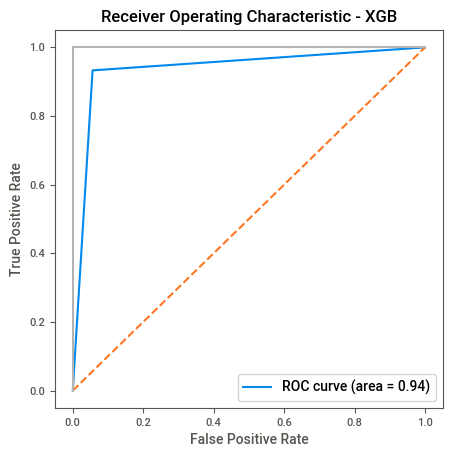

In [176]:
false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test, y_predict)
plt.subplots(1, figsize=(5,5))
plt.title('Receiver Operating Characteristic - XGB')
plt.plot(false_positive_rate1, true_positive_rate1,label="ROC curve (area = %0.2f)" % roc_score)
plt.legend(loc="lower right")
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [177]:
X_test

,State,Account_Length,Area_Code,International_Plan,VMail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_calls,Night_Charge,International_Calls,International_Charge,CustServ_Calls
4304,9,115,1,0,0,107,50,77,20,87,7,2,2,1
2711,48,142,2,0,0,102,39,110,14,120,8,3,2,1
3329,10,108,1,0,1,79,33,99,14,108,12,5,3,1
3927,37,64,0,0,0,74,10,94,18,96,8,4,2,1
5684,37,156,1,1,0,127,24,90,24,83,8,4,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5837,35,125,0,1,0,86,38,91,22,114,8,1,3,1
2287,20,189,1,0,1,116,26,50,16,108,7,6,4,1
4670,36,88,1,0,0,94,50,113,21,89,13,3,1,1
3735,21,62,2,0,0,100,35,91,19,77,9,5,1,0


In [178]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [179]:
model_6=RandomForestClassifier(random_state=43)#random_state=45

In [180]:
from sklearn.model_selection import RandomizedSearchCV
#Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 2000, num = 10)]
# # Number of features to consider at every split
max_features = ['auto', 'sqrt']
# # Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
# max_depth.append(None)
# #Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# # Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# # Method of selecting samples for training each tree
bootstrap = [True, False]

random_grid ={'n_estimators':n_estimators,
               'max_features':max_features,
               'max_depth':max_depth,
               'min_samples_split':min_samples_split,
               'min_samples_leaf':min_samples_leaf,
                'bootstrap':bootstrap}
    
print(random_grid)

{'n_estimators': [100, 311, 522, 733, 944, 1155, 1366, 1577, 1788, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [181]:
# # Use the random grid to search for best hyperparamet
# # Random search of parameters, using 3 fold cross validation, 
# # search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = model_6, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=1,random_state=42, n_jobs = -1)
# # Fit the random search model
rf_random.fit(X_train,y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=43),
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 311, 522, 733,
                                                         944, 1155, 1366, 1577,
                                                         1788, 2000]},
                   random_state=42, verbose=1)

In [182]:
rf_random.best_params_

{'n_estimators': 2000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 20,
 'bootstrap': False}

In [183]:
rf_random.best_score_

0.9091954022988507

In [184]:
model_6.fit(X_train,y_train)

y_predict=model_6.predict(X_test)
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       889
           1       0.93      0.93      0.93       851

    accuracy                           0.93      1740
   macro avg       0.93      0.93      0.93      1740
weighted avg       0.93      0.93      0.93      1740



In [185]:
print(accuracy_score(y_test,y_predict))

0.9287356321839081


In [186]:
predictions = model_6.predict_proba(X_test)
for row in predictions[0:10]:
    print('customer churn score is: {:.2f} %'.format(row[1]*100))

customer churn score is: 100.00 %
customer churn score is: 49.00 %
customer churn score is: 12.00 %
customer churn score is: 84.00 %
customer churn score is: 58.00 %
customer churn score is: 5.00 %
customer churn score is: 7.00 %
customer churn score is: 70.00 %
customer churn score is: 95.00 %
customer churn score is: 11.00 %


In [187]:
roc_curve(y_test,y_predict)

(array([0.        , 0.06861642, 1.        ]),
 array([0.        , 0.92596945, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [188]:
roc_score=roc_auc_score(y_test,y_predict)

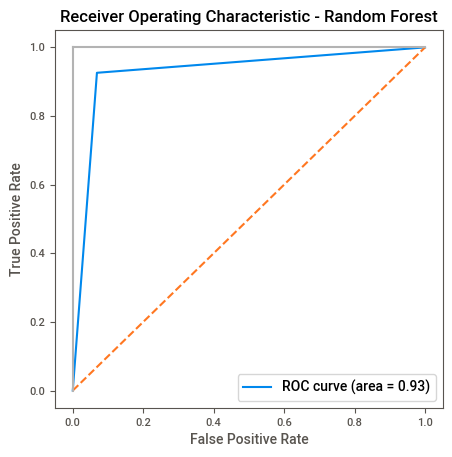

In [189]:
false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test, y_predict)
plt.subplots(1, figsize=(5,5))
plt.title('Receiver Operating Characteristic - Random Forest')
plt.plot(false_positive_rate1, true_positive_rate1,label="ROC curve (area = %0.2f)" % roc_score)
plt.legend(loc="lower right")
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c="0.7"), plt.plot([1, 1] , c="0.7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [190]:
### Random Forest using scaling 

In [191]:
scaler  = StandardScaler()
X1=scaler.fit_transform(X1)

In [192]:
from imblearn.over_sampling import SMOTE
sm=SMOTE(sampling_strategy="minority") 
X_sm1,y_sm1=sm.fit_resample(X1,y1)

In [193]:
X_train1,X_test1,y_train1,y_test1=train_test_split(X_sm1,y_sm1,test_size=.25,stratify=y_sm1,random_state=32) 

In [194]:
model_6.fit(X_train1,y_train1)

y_predict1=model_6.predict(X_test1)
print(classification_report(y_test1,y_predict1))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       870
           1       0.98      0.96      0.97       870

    accuracy                           0.97      1740
   macro avg       0.97      0.97      0.97      1740
weighted avg       0.97      0.97      0.97      1740



In [195]:
predictions = model_4.predict_proba(X_test1)
for row in predictions[0:10]:
    print('customer churn score is: {:.2f} %'.format(row[1]*100))

customer churn score is: 1.64 %
customer churn score is: 85.59 %
customer churn score is: 85.59 %
customer churn score is: 2.28 %
customer churn score is: 1.15 %
customer churn score is: 74.11 %
customer churn score is: 1.01 %
customer churn score is: 1.91 %
customer churn score is: 0.39 %
customer churn score is: 0.39 %


In [196]:
roc_score1=roc_auc_score(y_test,y_predict)

In [197]:
roc_curve(y_test,y_predict)

(array([0.        , 0.06861642, 1.        ]),
 array([0.        , 0.92596945, 1.        ]),
 array([2, 1, 0], dtype=int64))

Text(0.5, 0, 'False Positive Rate')

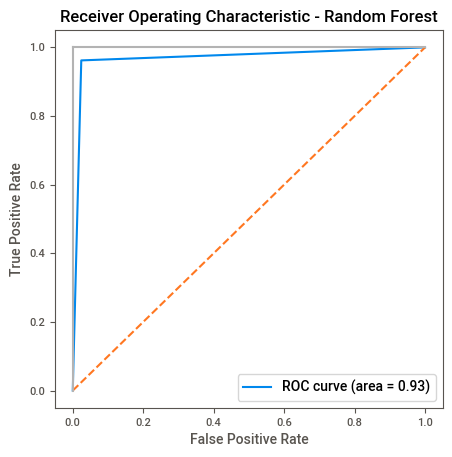

In [198]:
false_positive_rate1, true_positive_rate1, threshold1 = roc_curve(y_test1, y_predict1)
plt.subplots(1, figsize=(5,5))
plt.title('Receiver Operating Characteristic - Random Forest')
plt.plot(false_positive_rate1, true_positive_rate1,label="ROC curve (area = %0.2f)" % roc_score1)
plt.legend(loc="lower right")
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c="0.7"), plt.plot([1, 1] , c="0.7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
